In [1]:
import pandas as pd
import numpy as np
import os
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings("ignore")
sns.set(style="whitegrid")
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.model_selection import train_test_split, StratifiedKFold, GridSearchCV, cross_val_score
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier
from sklearn.metrics import confusion_matrix, accuracy_score, f1_score, roc_auc_score, roc_curve
from sklearn.metrics import classification_report,precision_score, recall_score
from sklearn.decomposition import PCA

# Data source-Weather

In [2]:
df=pd.read_csv("Weather.csv")
df.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No


In [3]:
df.columns

Index(['Date', 'Location', 'MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation',
       'Sunshine', 'WindGustDir', 'WindGustSpeed', 'WindDir9am', 'WindDir3pm',
       'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm',
       'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am',
       'Temp3pm', 'RainToday', 'RainTomorrow'],
      dtype='object')

In [4]:
df.shape

(8425, 23)

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8425 entries, 0 to 8424
Data columns (total 23 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Date           8425 non-null   object 
 1   Location       8425 non-null   object 
 2   MinTemp        8350 non-null   float64
 3   MaxTemp        8365 non-null   float64
 4   Rainfall       8185 non-null   float64
 5   Evaporation    4913 non-null   float64
 6   Sunshine       4431 non-null   float64
 7   WindGustDir    7434 non-null   object 
 8   WindGustSpeed  7434 non-null   float64
 9   WindDir9am     7596 non-null   object 
 10  WindDir3pm     8117 non-null   object 
 11  WindSpeed9am   8349 non-null   float64
 12  WindSpeed3pm   8318 non-null   float64
 13  Humidity9am    8366 non-null   float64
 14  Humidity3pm    8323 non-null   float64
 15  Pressure9am    7116 non-null   float64
 16  Pressure3pm    7113 non-null   float64
 17  Cloud9am       6004 non-null   float64
 18  Cloud3pm

The data has Float and Object Values for various variables.

# Preprocess the Data

In [6]:
df = df[list(df.columns[2:])]
df = df.drop(['WindGustDir', 'WindDir9am', 'WindDir3pm'], axis=1)
df = df.dropna()
print(df.shape)
df.head()

(3863, 18)


,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
907,19.8,27.1,24.4,8.6,9.0,35.0,17.0,22.0,83.0,60.0,1018.9,1017.9,6.0,6.0,22.0,26.0,Yes,Yes
908,18.7,25.6,6.8,3.8,3.4,33.0,17.0,13.0,85.0,90.0,1020.7,1020.1,4.0,7.0,21.0,20.9,Yes,Yes
909,16.5,25.5,16.8,2.8,6.1,19.0,6.0,9.0,84.0,65.0,1021.5,1020.1,5.0,7.0,21.0,24.5,Yes,No
910,18.5,26.9,0.0,3.2,11.0,30.0,7.0,20.0,68.0,60.0,1018.9,1016.6,2.0,5.0,23.3,26.4,No,No
911,18.2,28.2,0.0,6.8,9.0,50.0,13.0,35.0,67.0,68.0,1016.3,1012.8,1.0,1.0,24.0,25.9,No,Yes


# Calculate the VIF Value

In [7]:
import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor

X = df[list(df.columns[:-2])]

vif_info = pd.DataFrame()
vif_info['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif_info['Column'] = X.columns
vif_info.sort_values('VIF', ascending=False)

,VIF,Column
10,465694.964841,Pressure9am
11,463220.567555,Pressure3pm
15,706.692837,Temp3pm
1,605.600750,MaxTemp
14,198.495355,Temp9am
8,63.134845,Humidity9am
0,59.953211,MinTemp
9,50.973704,Humidity3pm
5,30.676516,WindGustSpeed
4,19.819207,Sunshine


# Remove Multicollinearities

In [8]:
df['TempDiff'] = df['Temp3pm'] - df['Temp9am']
df['HumidityDiff'] = df['Humidity3pm'] - df['Humidity9am']
df['CloudDiff'] = df['Cloud3pm'] - df['Cloud9am']
df['WindSpeedDiff'] = df['WindSpeed3pm'] - df['WindSpeed9am']
df['PressureDiff'] = df['Pressure3pm'] - df['Pressure9am']

X = df.drop(['Temp3pm', 'Temp9am', 'Humidity3pm', 'Humidity9am', 'Cloud3pm', 'Cloud9am', 'WindSpeed3pm', 'WindSpeed9am', 'Pressure3pm', 'Pressure9am', 'RainToday', 'RainTomorrow'], axis=1)

X.head()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,TempDiff,HumidityDiff,CloudDiff,WindSpeedDiff,PressureDiff
907,19.8,27.1,24.4,8.6,9.0,35.0,4.0,-23.0,0.0,5.0,-1.0
908,18.7,25.6,6.8,3.8,3.4,33.0,-0.1,5.0,3.0,-4.0,-0.6
909,16.5,25.5,16.8,2.8,6.1,19.0,3.5,-19.0,2.0,3.0,-1.4
910,18.5,26.9,0.0,3.2,11.0,30.0,3.1,-8.0,3.0,13.0,-2.3
911,18.2,28.2,0.0,6.8,9.0,50.0,1.9,1.0,0.0,22.0,-3.5


In [9]:
vif_info = pd.DataFrame()
vif_info['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif_info['Column'] = X.columns
vif_info.sort_values('VIF', ascending=False)

,VIF,Column
1,97.729891,MaxTemp
0,41.446300,MinTemp
6,11.725427,TempDiff
4,10.518673,Sunshine
5,7.903908,WindGustSpeed
7,4.924876,HumidityDiff
3,4.881766,Evaporation
10,4.076997,PressureDiff
9,1.330767,WindSpeedDiff
2,1.214928,Rainfall


In [10]:
X = X.drop(['MaxTemp', 'MinTemp', 'TempDiff', 'Sunshine'], axis=1)

vif_info = pd.DataFrame()
vif_info['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif_info['Column'] = X.columns
vif_info.sort_values('VIF', ascending=False)

,VIF,Column
2,4.537571,WindGustSpeed
1,3.309401,Evaporation
6,2.592025,PressureDiff
3,2.043731,HumidityDiff
5,1.161288,WindSpeedDiff
0,1.140455,Rainfall
4,1.047906,CloudDiff


# List of categorical & Numerical columns

In [11]:
numCol=[]
catCol=[]

for col in df.columns:
    if df[col].dtype=='O':
        catCol.append(col)
    else:
            numCol.append(col)

In [12]:
print("List of categorical columns:",catCol)
print("List of numerical columns:",numCol)

List of categorical columns: ['RainToday', 'RainTomorrow']
List of numerical columns: ['MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine', 'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am', 'Temp3pm', 'TempDiff', 'HumidityDiff', 'CloudDiff', 'WindSpeedDiff', 'PressureDiff']


# Missing Value Analysis of Dataset

In [13]:
df.isna().sum()

MinTemp          0
MaxTemp          0
Rainfall         0
Evaporation      0
Sunshine         0
WindGustSpeed    0
WindSpeed9am     0
WindSpeed3pm     0
Humidity9am      0
Humidity3pm      0
Pressure9am      0
Pressure3pm      0
Cloud9am         0
Cloud3pm         0
Temp9am          0
Temp3pm          0
RainToday        0
RainTomorrow     0
TempDiff         0
HumidityDiff     0
CloudDiff        0
WindSpeedDiff    0
PressureDiff     0
dtype: int64

No missing values are found in this data sets

In [14]:
df[df.isna().sum(axis=1)>1]

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,...,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,TempDiff,HumidityDiff,CloudDiff,WindSpeedDiff,PressureDiff


No missing or null values found in this data sets

# Check Duplicate,Repeated and Unknown values

In [15]:
df[df.duplicated()]

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,...,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,TempDiff,HumidityDiff,CloudDiff,WindSpeedDiff,PressureDiff
3674,13.1,31.6,0.0,6.4,11.1,33.0,11.0,22.0,67.0,37.0,...,1.0,21.5,30.3,No,No,8.8,-30.0,0.0,11.0,-5.0
3675,16.6,34.1,0.0,6.6,9.9,44.0,15.0,22.0,54.0,39.0,...,5.0,24.7,30.2,No,Yes,5.5,-15.0,4.0,7.0,-4.1
3679,10.8,27.8,24.8,18.0,10.2,35.0,0.0,15.0,71.0,37.0,...,2.0,19.3,27.4,Yes,No,8.1,-34.0,0.0,15.0,-4.2
3680,14.0,33.6,0.0,6.4,7.5,63.0,19.0,19.0,59.0,54.0,...,7.0,22.9,26.7,No,Yes,3.8,-5.0,6.0,0.0,-2.7
3681,16.7,20.3,9.2,7.6,1.5,56.0,28.0,35.0,80.0,48.0,...,7.0,17.6,19.4,Yes,Yes,1.8,-32.0,-1.0,7.0,0.9
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6137,15.6,24.0,0.0,7.0,12.3,41.0,15.0,19.0,59.0,52.0,...,1.0,18.6,23.1,No,No,4.5,-7.0,-6.0,4.0,-1.4
6138,16.3,21.5,0.0,7.0,0.0,30.0,15.0,15.0,76.0,67.0,...,8.0,17.6,19.9,No,No,2.3,-9.0,0.0,0.0,-1.6
6141,18.6,33.5,0.0,11.4,13.3,56.0,35.0,17.0,40.0,28.0,...,1.0,24.1,33.4,No,No,9.3,-12.0,1.0,-18.0,-3.8
6142,20.4,35.0,0.0,12.8,13.3,67.0,44.0,24.0,38.0,22.0,...,3.0,24.4,33.7,No,No,9.3,-16.0,3.0,-20.0,-3.5


Data has duplicate or repeated or unknown values in various rows and columns.

In [16]:
for i in catCol:
    print(i,"---%Null", (df[i].shape[0]-df[i].notnull().sum()) / df[i].shape[0]*100)
    print(df[i].value_counts())
    print("\n")

RainToday ---%Null 0.0
No     2946
Yes     917
Name: RainToday, dtype: int64


RainTomorrow ---%Null 0.0
No     2957
Yes     906
Name: RainTomorrow, dtype: int64




In [17]:
for i in numCol:
    print(i,"---%Null", (df[i].shape[0]-df[i].notnull().sum()) / df[i].shape[0]*100)
    print(df[i].value_counts())
    print("\n")

MinTemp ---%Null 0.0
 12.7    46
 13.8    34
 13.2    33
 13.7    33
 10.8    33
         ..
 24.8     1
 2.2      1
-0.3      1
 28.5     1
 26.6     1
Name: MinTemp, Length: 253, dtype: int64


MaxTemp ---%Null 0.0
22.6    39
22.5    36
20.1    34
23.8    33
22.3    33
        ..
37.3     1
38.4     1
41.0     1
40.1     1
39.4     1
Name: MaxTemp, Length: 288, dtype: int64


Rainfall ---%Null 0.0
0.0     2607
0.2      153
0.4       78
1.2       44
0.6       44
        ... 
14.4       1
14.2       1
21.0       1
27.6       1
26.8       1
Name: Rainfall, Length: 177, dtype: int64


Evaporation ---%Null 0.0
4.0     140
2.2     119
3.0     117
2.6     117
2.4     116
       ... 
17.0      1
0.7       1
15.6      1
15.0      1
13.6      1
Name: Evaporation, Length: 101, dtype: int64


Sunshine ---%Null 0.0
0.0     129
11.0     64
11.2     63
11.1     61
10.7     60
       ... 
2.5       6
13.7      6
13.8      4
13.9      3
13.5      2
Name: Sunshine, Length: 140, dtype: int64


WindGust

# Descriptive Statistics

In [18]:
df.describe(include='all')

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,...,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,TempDiff,HumidityDiff,CloudDiff,WindSpeedDiff,PressureDiff
count,3863.000000,3863.000000,3863.000000,3863.000000,3863.000000,3863.000000,3863.000000,3863.000000,3863.000000,3863.000000,...,3863.000000,3863.000000,3863.000000,3863,3863,3863.000000,3863.000000,3863.000000,3863.000000,3863.000000
unique,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,2,2,NaN,NaN,NaN,NaN,NaN
top,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,No,No,NaN,NaN,NaN,NaN,NaN
freq,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,2946,2957,NaN,NaN,NaN,NaN,NaN
mean,14.006549,24.668651,2.477505,5.249003,7.818121,40.946932,16.095004,19.916645,63.967124,49.612218,...,4.220295,18.901812,23.162542,NaN,NaN,4.260730,-14.354906,0.100958,3.821641,-2.455734
std,5.196622,6.068042,7.782405,3.648030,3.826440,13.894644,9.654440,8.803734,16.341377,17.710319,...,2.647489,5.540401,5.926450,NaN,NaN,3.067797,14.111126,2.286940,9.038987,1.839351
min,-0.700000,10.800000,0.000000,0.000000,0.000000,13.000000,0.000000,0.000000,11.000000,6.000000,...,0.000000,4.500000,9.400000,NaN,NaN,-6.500000,-74.000000,-8.000000,-30.000000,-10.300000
25%,10.100000,20.200000,0.000000,2.600000,5.200000,31.000000,9.000000,13.000000,53.000000,38.000000,...,1.000000,14.800000,19.000000,NaN,NaN,2.200000,-24.000000,-1.000000,-2.000000,-3.700000
50%,13.900000,24.000000,0.000000,4.600000,8.800000,39.000000,15.000000,20.000000,64.000000,49.000000,...,5.000000,18.600000,22.600000,NaN,NaN,4.000000,-15.000000,0.000000,4.000000,-2.700000
75%,17.900000,29.100000,0.800000,7.000000,10.800000,50.000000,22.000000,26.000000,75.000000,61.000000,...,7.000000,23.200000,27.300000,NaN,NaN,6.200000,-6.000000,1.000000,10.000000,-1.400000


In [19]:
df[numCol].describe

<bound method NDFrame.describe of       MinTemp  MaxTemp  Rainfall  Evaporation  Sunshine  WindGustSpeed  \
907      19.8     27.1      24.4          8.6       9.0           35.0   
908      18.7     25.6       6.8          3.8       3.4           33.0   
909      16.5     25.5      16.8          2.8       6.1           19.0   
910      18.5     26.9       0.0          3.2      11.0           30.0   
911      18.2     28.2       0.0          6.8       9.0           50.0   
...       ...      ...       ...          ...       ...            ...   
8381     25.2     34.5       3.0          4.0       9.2           39.0   
8382     26.2     33.3       0.0          6.0       5.9           54.0   
8383     24.9     32.8      20.4          6.2       8.7           37.0   
8384     25.5     33.1       0.0          4.8       7.1           37.0   
8385     24.9     34.3       0.0          5.6       8.6           39.0   

      WindSpeed9am  WindSpeed3pm  Humidity9am  Humidity3pm  ...  Pressure3pm 

In [20]:
df[catCol].describe

<bound method NDFrame.describe of      RainToday RainTomorrow
907        Yes          Yes
908        Yes          Yes
909        Yes           No
910         No           No
911         No          Yes
...        ...          ...
8381       Yes           No
8382        No          Yes
8383       Yes           No
8384        No           No
8385        No           No

[3863 rows x 2 columns]>

In [21]:
df[catCol].describe().T

,count,unique,top,freq
RainToday,3863,2,No,2946
RainTomorrow,3863,2,No,2957


# Univariate Analysis

In [22]:
for i in catCol:
    print(i)
    print(df[i].nunique())
    print(df[i].value_counts())
    print("\n")

RainToday
2
No     2946
Yes     917
Name: RainToday, dtype: int64


RainTomorrow
2
No     2957
Yes     906
Name: RainTomorrow, dtype: int64




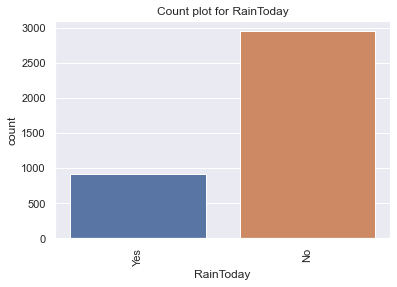

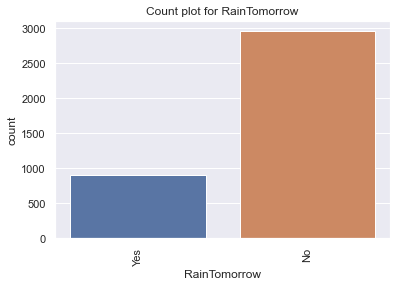

In [23]:
for i in catCol:
    plt.figure()
    sns.set_theme(style="darkgrid")
    sns.countplot(df[i])
    plt.xticks(rotation=90)
    plt.title(f"Count plot for {i}")
    plt.plot()
    plt.show()

<Figure size 432x288 with 0 Axes>

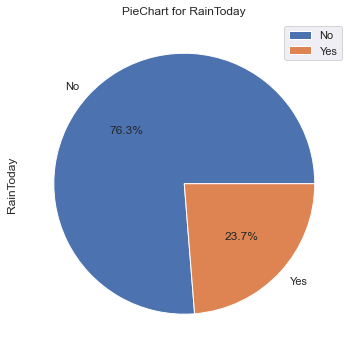

<Figure size 432x288 with 0 Axes>

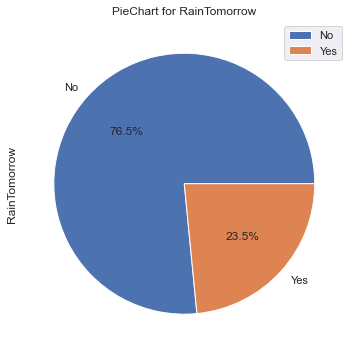

In [24]:
for i in catCol:
    plt.figure()
    sns.set_theme(style="darkgrid")
    countsDF= pd.DataFrame(df[i].value_counts())
    plot= countsDF.plot.pie(subplots=True,autopct="%.1f%%",figsize=(11,6))
    plt.title(f"PieChart for {i}")
    plt.plot()
    plt.show()

In [25]:
for i in numCol:
    print(i)
    print(df[i].nunique())
    print(df[i].value_counts())
    print("\n")

MinTemp
253
 12.7    46
 13.8    34
 13.2    33
 13.7    33
 10.8    33
         ..
 24.8     1
 2.2      1
-0.3      1
 28.5     1
 26.6     1
Name: MinTemp, Length: 253, dtype: int64


MaxTemp
288
22.6    39
22.5    36
20.1    34
23.8    33
22.3    33
        ..
37.3     1
38.4     1
41.0     1
40.1     1
39.4     1
Name: MaxTemp, Length: 288, dtype: int64


Rainfall
177
0.0     2607
0.2      153
0.4       78
1.2       44
0.6       44
        ... 
14.4       1
14.2       1
21.0       1
27.6       1
26.8       1
Name: Rainfall, Length: 177, dtype: int64


Evaporation
101
4.0     140
2.2     119
3.0     117
2.6     117
2.4     116
       ... 
17.0      1
0.7       1
15.6      1
15.0      1
13.6      1
Name: Evaporation, Length: 101, dtype: int64


Sunshine
140
0.0     129
11.0     64
11.2     63
11.1     61
10.7     60
       ... 
2.5       6
13.7      6
13.8      4
13.9      3
13.5      2
Name: Sunshine, Length: 140, dtype: int64


WindGustSpeed
46
37.0     251
39.0     250
33.0     2

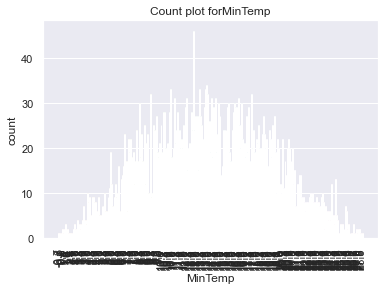

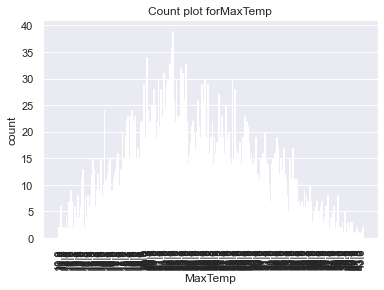

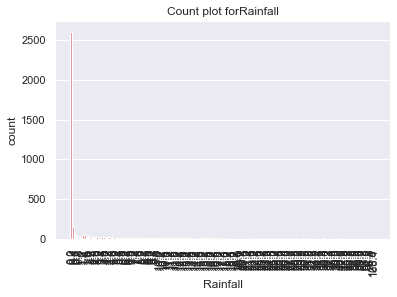

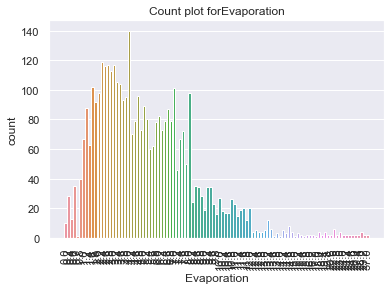

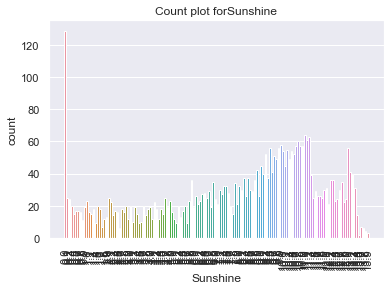

...

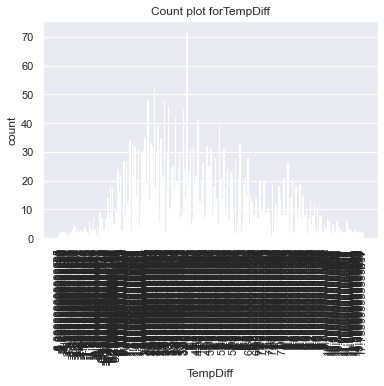

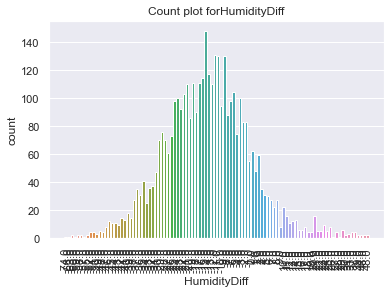

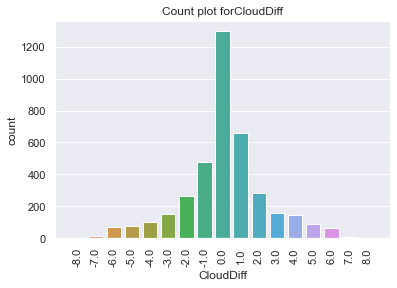

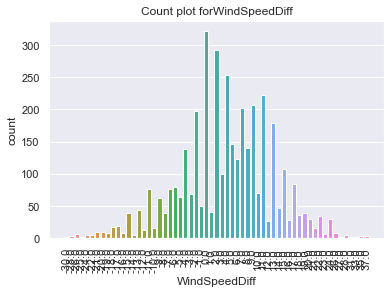

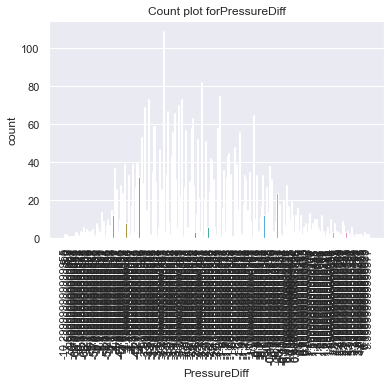

In [26]:
for i in numCol:
    plt.figure()
    sns.set_theme(style="darkgrid")
    sns.countplot(df[i])
    plt.xticks(rotation=90)
    plt.title(f"Count plot for{i}")
    plt.plot()
    plt.show()

MinTemp


<Figure size 432x288 with 0 Axes>

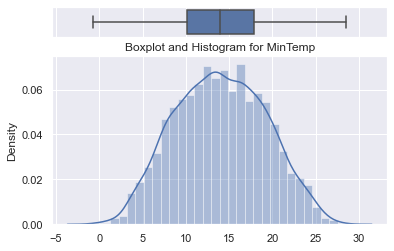

MaxTemp


<Figure size 432x288 with 0 Axes>

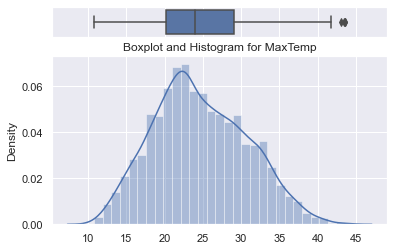

Rainfall


<Figure size 432x288 with 0 Axes>

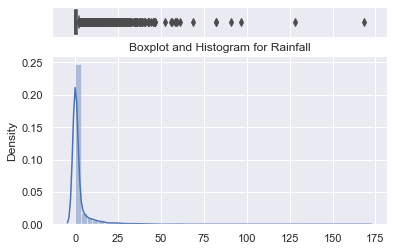

Evaporation


<Figure size 432x288 with 0 Axes>

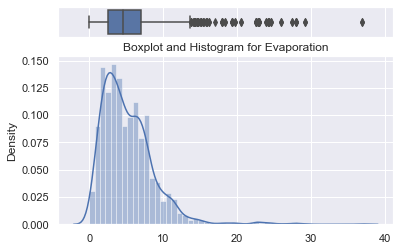

Sunshine


<Figure size 432x288 with 0 Axes>

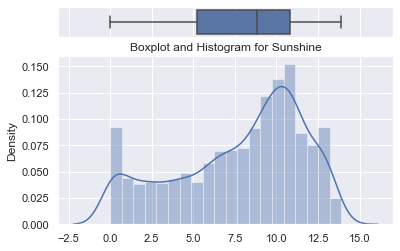

WindGustSpeed


<Figure size 432x288 with 0 Axes>

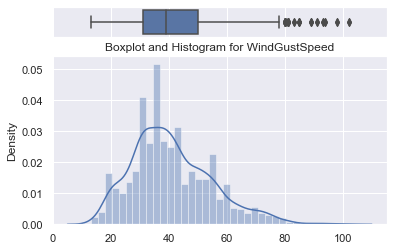

WindSpeed9am


<Figure size 432x288 with 0 Axes>

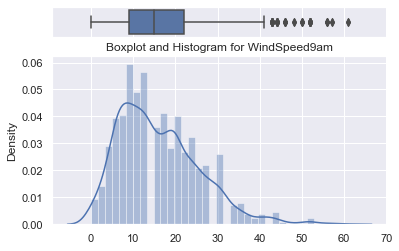

WindSpeed3pm


<Figure size 432x288 with 0 Axes>

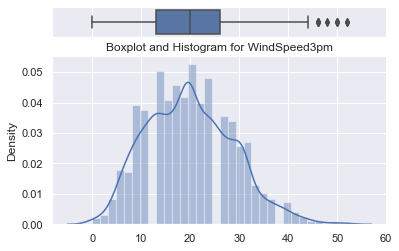

Humidity9am


<Figure size 432x288 with 0 Axes>

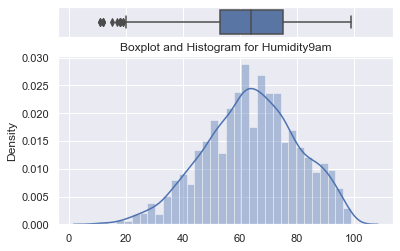

Humidity3pm


<Figure size 432x288 with 0 Axes>

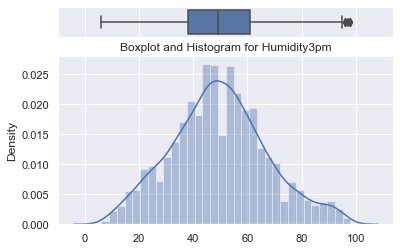

Pressure9am


<Figure size 432x288 with 0 Axes>

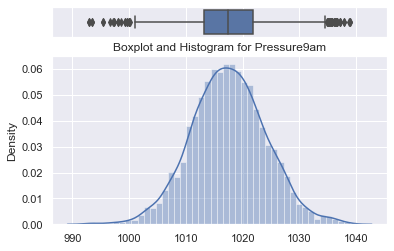

Pressure3pm


<Figure size 432x288 with 0 Axes>

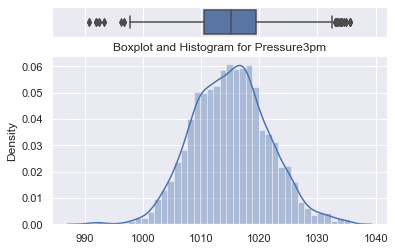

Cloud9am


<Figure size 432x288 with 0 Axes>

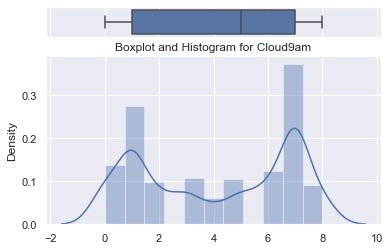

Cloud3pm


<Figure size 432x288 with 0 Axes>

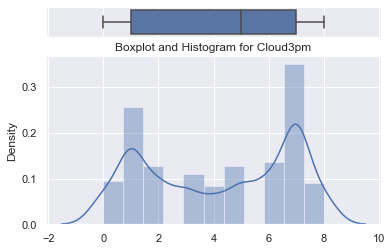

Temp9am


<Figure size 432x288 with 0 Axes>

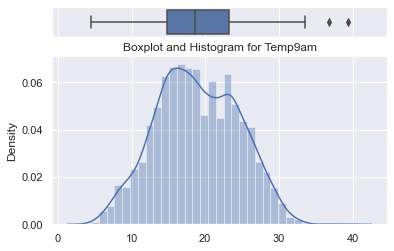

Temp3pm


<Figure size 432x288 with 0 Axes>

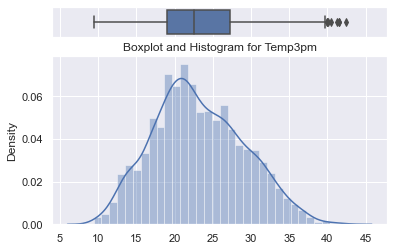

TempDiff


<Figure size 432x288 with 0 Axes>

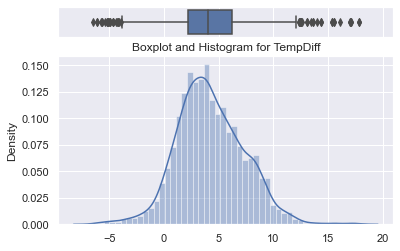

HumidityDiff


<Figure size 432x288 with 0 Axes>

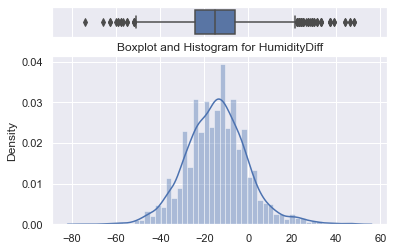

CloudDiff


<Figure size 432x288 with 0 Axes>

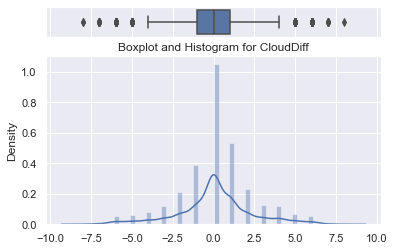

WindSpeedDiff


<Figure size 432x288 with 0 Axes>

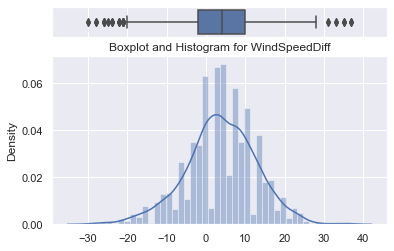

PressureDiff


<Figure size 432x288 with 0 Axes>

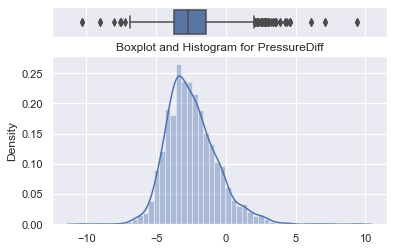

In [27]:
for i in numCol:
    print(i)
    plt.figure()
    sns.set_theme(style="darkgrid")
    f, (ax_box, ax_hist) = plt.subplots(2, sharex=True, gridspec_kw={"height_ratios":(.15,.85)})
    sns.boxplot(x = df[i],ax=ax_box)
    #sns.histplot (data=df, x=i, ax=ax_hist)
    sns.distplot(x= df[i],ax=ax_hist)
    ax_box.set(xlabel='')
    plt.plot()
    plt.title(f"Boxplot and Histogram for {i}")
    plt.show()

In [28]:
pd.DataFrame(df.skew(axis=0,skipna=True))

,0
MinTemp,0.029111
MaxTemp,0.245393
Rainfall,7.483221
Evaporation,2.108017
Sunshine,-0.583583
WindGustSpeed,0.700564
WindSpeed9am,0.888328
WindSpeed3pm,0.337160
Humidity9am,-0.199448
Humidity3pm,0.181398


# Multivariate Analysis

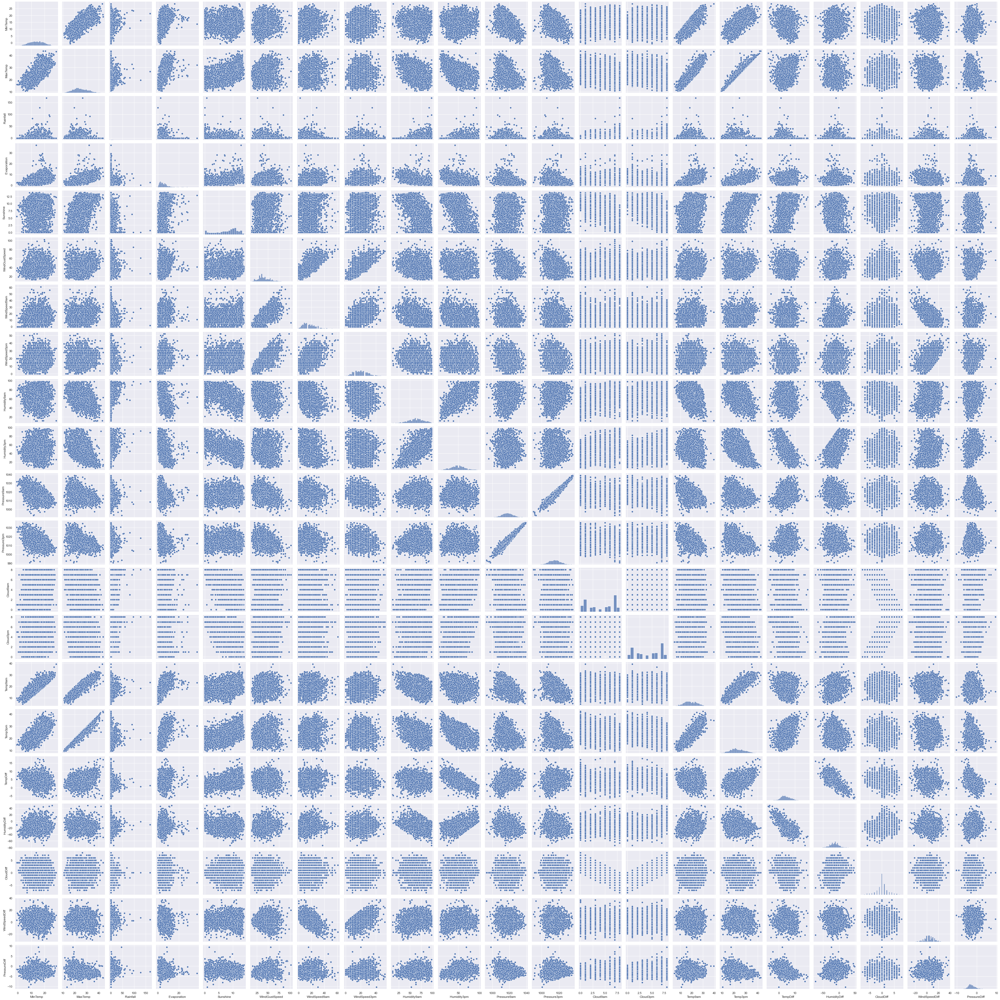

In [29]:
sns.pairplot(df)
plt.plot()
plt.show()

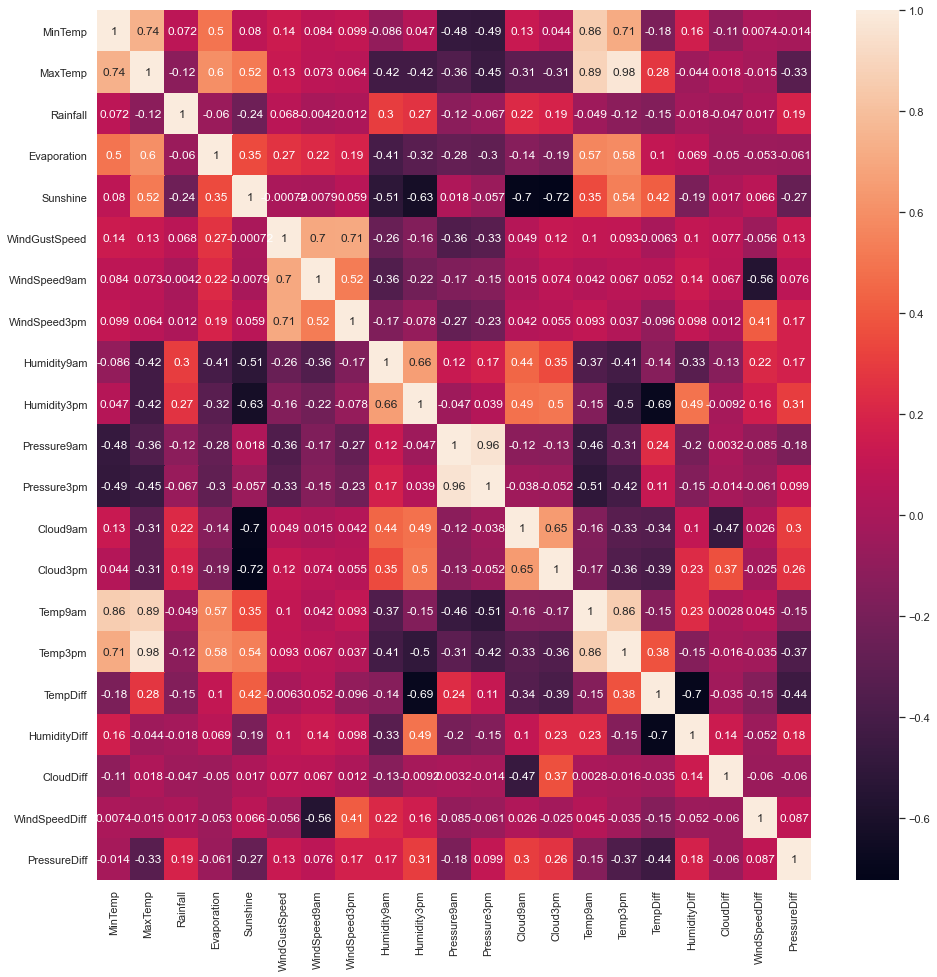

In [30]:
plt.figure(figsize= (16,16))
sns.heatmap(df.corr(),annot=True)
plt.show()

# Data Scaling of Rainfall

In [31]:
from sklearn.impute import SimpleImputer
imp_median = SimpleImputer(missing_values=np.nan, strategy='median')
imp_mode = SimpleImputer(missing_values=np.nan,strategy='most_frequent')

In [32]:
df_num=pd.DataFrame(imp_median.fit_transform(df[numCol]), columns=numCol)
df_cat=pd.DataFrame(imp_mode.fit_transform(df[catCol]),columns=catCol)

In [33]:
df=pd.concat([df_num,df_cat],axis=1)

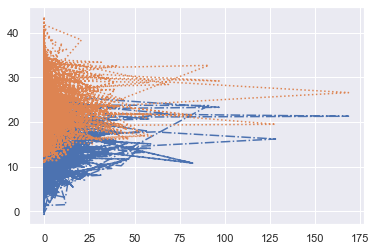

In [34]:
plt.plot(df["Rainfall"],df["MinTemp"],label="Line1",linestyle="-.")
plt.plot(df["Rainfall"],df["MaxTemp"],label="Line2",linestyle=":")
plt.plot();

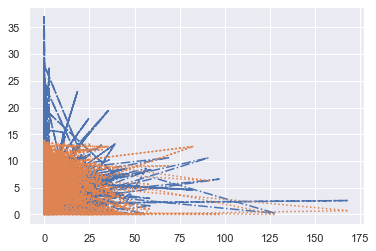

In [35]:
plt.plot(df["Rainfall"],df["Evaporation"],label="Line1",linestyle="-.")
plt.plot(df["Rainfall"],df["Sunshine"],label="Line2",linestyle=":")
plt.plot();

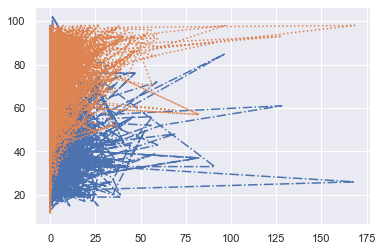

In [36]:
plt.plot(df["Rainfall"],df["WindGustSpeed"],label="Line1",linestyle="-.")
plt.plot(df["Rainfall"],df["Humidity9am"],label="Line2",linestyle=":")
plt.plot();

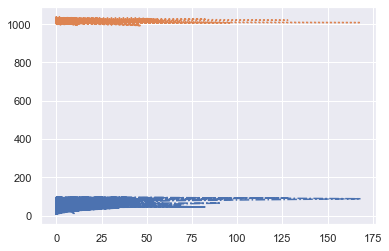

In [37]:
plt.plot(df["Rainfall"],df["Humidity3pm"],label="Line1",linestyle="-.")
plt.plot(df["Rainfall"],df["Pressure9am"],label="Line2",linestyle=":")
plt.plot();

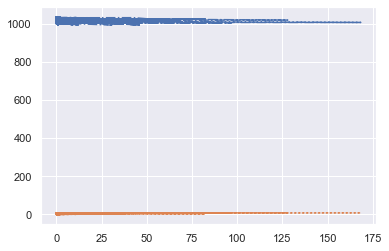

In [38]:
plt.plot(df["Rainfall"],df["Pressure3pm"],label="Line1",linestyle="-.")
plt.plot(df["Rainfall"],df["Cloud9am"],label="Line2",linestyle=":")
plt.plot();

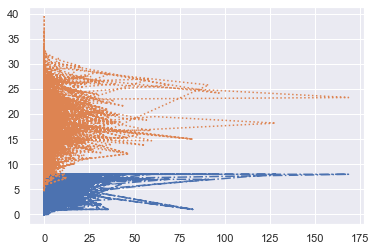

In [39]:
plt.plot(df["Rainfall"],df["Cloud3pm"],label="Line1",linestyle="-.")
plt.plot(df["Rainfall"],df["Temp9am"],label="Line2",linestyle=":")
plt.plot();

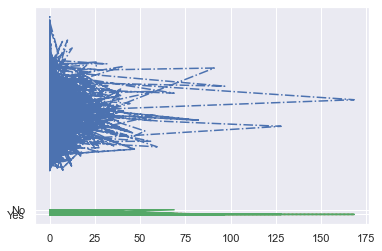

In [40]:
plt.plot(df["Rainfall"],df["Temp3pm"],label="Line1",linestyle="-.")
plt.plot(df["Rainfall"],df["RainToday"],label="Line2",linestyle=":")
plt.plot(df["Rainfall"],df["RainTomorrow"],label="Line3",linestyle="solid")
plt.plot();

# Matplotlib-Pandas for Rainfall Section

In [41]:
import matplotlib.pyplot as plt
%matplotlib inline

In [42]:
df=pd.read_csv("Weather.csv")
df.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No


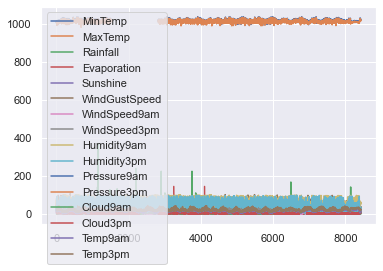

In [43]:
df = pd.read_csv('Weather.csv')

df.plot()

plt.show()

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


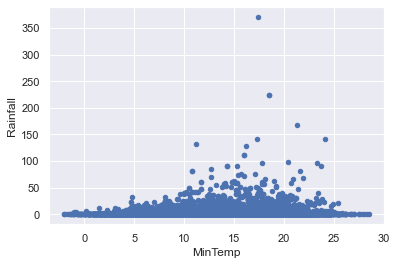

In [44]:
df = pd.read_csv('Weather.csv')

df.plot(kind = 'scatter', x = 'MinTemp', y = 'Rainfall')

plt.show()

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


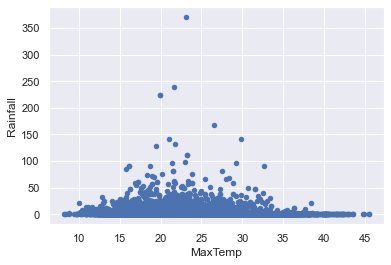

In [45]:
df = pd.read_csv('Weather.csv')

df.plot(kind = 'scatter', x = 'MaxTemp', y = 'Rainfall')

plt.show()

<AxesSubplot:ylabel='Frequency'>

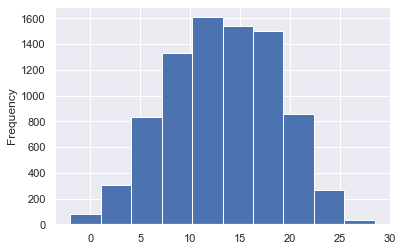

In [46]:
df["MinTemp"].plot(kind = 'hist')

<AxesSubplot:ylabel='Frequency'>

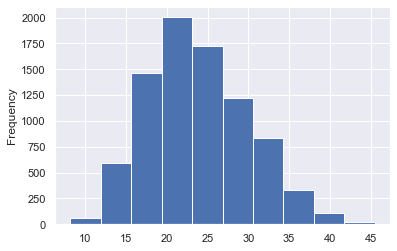

In [47]:
df["MaxTemp"].plot(kind = 'hist')

<AxesSubplot:ylabel='Frequency'>

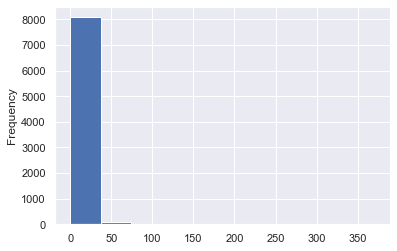

In [48]:
df["Rainfall"].plot(kind = 'hist')

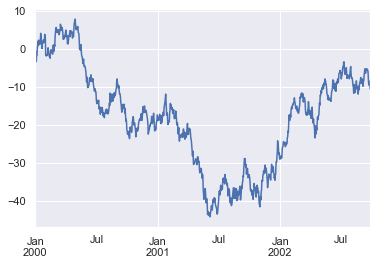

In [49]:
ts = pd.Series(np.random.randn(1000), index = pd.date_range(
                                '1/1/2000', periods = 1000))
ts = ts.cumsum()
ts.plot()
 
plt.show()

<Figure size 432x288 with 0 Axes>

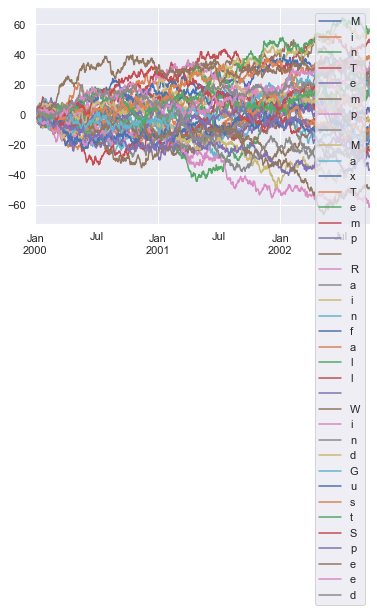

In [50]:
ts = pd.Series(np.random.randn(1000), index = pd.date_range(
                                '1/1/2000', periods = 1000))
 
df = pd.DataFrame(np.random.randn(1000, 38),
   index = ts.index, columns = list('MinTemp MaxTemp Rainfall WindGustSpeed'))
 
df = df.cumsum()
plt.figure()
df.plot()
plt.show()

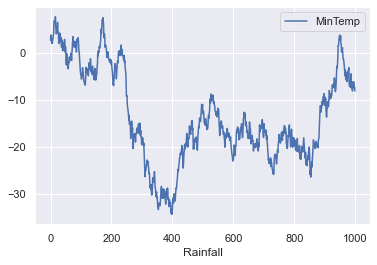

In [51]:
ts = pd.Series(np.random.randn(1000), index = pd.date_range(
                                '1/1/2000', periods = 1000))
 
df = pd.DataFrame(np.random.randn(1000, 8), index = ts.index,
                                      columns = list('Rainfall'))
 
df3 = pd.DataFrame(np.random.randn(1000, 2),
               columns =['MinTemp', 'MaxTemp']).cumsum()
 
df3['Rainfall'] = pd.Series(list(range(len(df))))
df3.plot(x ='Rainfall', y ='MinTemp')
plt.show()

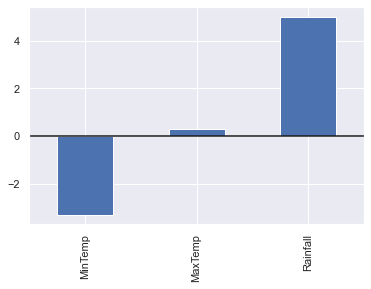

In [52]:
ts = pd.Series(np.random.randn(1000), index = pd.date_range(
                                '1/1/2000', periods = 1000))
 
df = pd.DataFrame(np.random.randn(1000, 8), index = ts.index,
                                      columns = list('Rainfall'))
 
df3 = pd.DataFrame(np.random.randn(1000, 2),
               columns =['MinTemp', 'MaxTemp']).cumsum()
 
df3['Rainfall'] = pd.Series(list(range(len(df))))
df3.iloc[5].plot.bar()
plt.axhline(0, color ='k')
 
plt.show()

<Figure size 432x288 with 0 Axes>

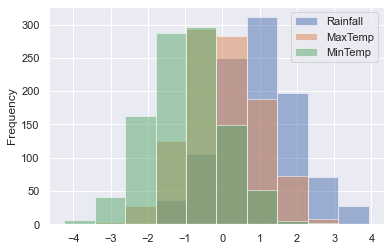

In [53]:
df4 = pd.DataFrame({'Rainfall': np.random.randn(1000) + 1,
                    'MaxTemp': np.random.randn(1000),
                    'MinTemp': np.random.randn(1000) - 1},
                           columns =['Rainfall', 'MaxTemp', 'MinTemp'])
plt.figure()
 
df4.plot.hist(alpha = 0.5)
plt.show()

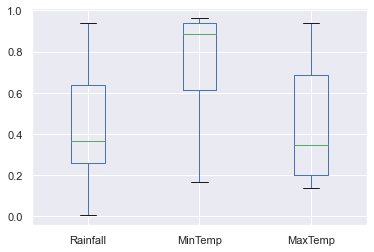

In [54]:
df = pd.DataFrame(np.random.rand(10, 3),
      columns =['Rainfall', 'MinTemp', 'MaxTemp'])
 
df.plot.box()
plt.show()

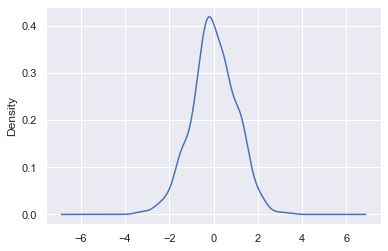

In [55]:
#Density Plot
df = pd.DataFrame(np.random.rand(10, 3),
      columns =['Rainfall', 'MinTemp', 'MaxTemp'])
 
ser = pd.Series(np.random.randn(1000))
ser.plot.kde()
 
plt.show()


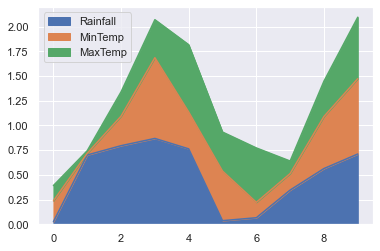

In [56]:
#Area plot using matplotlib
df = pd.DataFrame(np.random.rand(10, 3),
       columns =['Rainfall', 'MinTemp', 'MaxTemp'])
 
df.plot.area()
plt.show()


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


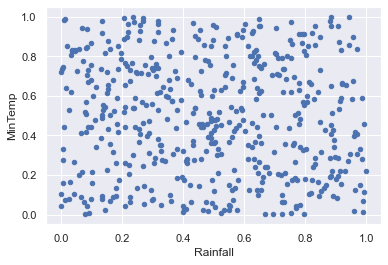

In [57]:
#Scatter plot
df = pd.DataFrame(np.random.rand(500, 3),
           columns =['Rainfall', 'MinTemp', 'MaxTemp'])
 
df.plot.scatter(x ='Rainfall', y ='MinTemp')
plt.show()


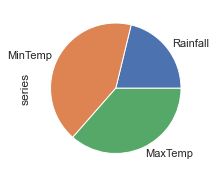

In [58]:
series = pd.Series(3 * np.random.rand(3),
  index =['Rainfall', 'MinTemp', 'MaxTemp'], name ='series')
 
series.plot.pie(figsize =(3, 3))
plt.show()

# Heatmap of Dataset

<AxesSubplot:>

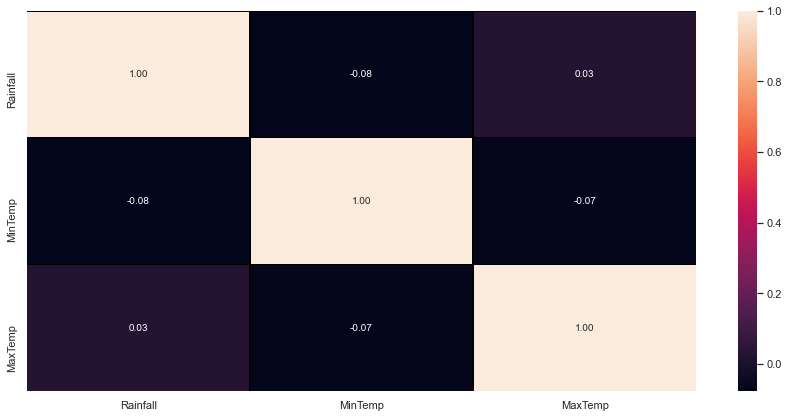

In [59]:
plt.figure(figsize=(15,7))
sns.heatmap(df.corr(), annot=True, linewidths=0.5,linecolor="black", fmt='.2f')

In [60]:
df.describe()

,Rainfall,MinTemp,MaxTemp
count,500.000000,500.000000,500.000000
mean,0.487095,0.492837,0.508208
std,0.280129,0.289186,0.285694
min,0.001323,0.001074,0.000995
25%,0.243834,0.244753,0.271682
50%,0.492079,0.486434,0.514258
75%,0.726642,0.737795,0.741976
max,0.997321,0.999530,0.998344


In [61]:
df.skew

<bound method NDFrame._add_numeric_operations.<locals>.skew of      Rainfall   MinTemp   MaxTemp
0    0.317088  0.964027  0.382604
1    0.007700  0.331023  0.720177
2    0.601678  0.420845  0.991228
3    0.502262  0.120479  0.670857
4    0.627269  0.927768  0.639084
..        ...       ...       ...
495  0.538975  0.713788  0.360937
496  0.610796  0.279071  0.333133
497  0.103344  0.158536  0.756947
498  0.272093  0.053908  0.240470
499  0.393798  0.577804  0.455135

[500 rows x 3 columns]>

# Data Preprocessing

In [62]:
df = pd.read_csv("Weather.csv")
df.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No


In [63]:
df.shape

(8425, 23)

In [64]:
df.isnull().sum()

Date                0
Location            0
MinTemp            75
MaxTemp            60
Rainfall          240
Evaporation      3512
Sunshine         3994
WindGustDir       991
WindGustSpeed     991
WindDir9am        829
WindDir3pm        308
WindSpeed9am       76
WindSpeed3pm      107
Humidity9am        59
Humidity3pm       102
Pressure9am      1309
Pressure3pm      1312
Cloud9am         2421
Cloud3pm         2455
Temp9am            56
Temp3pm            96
RainToday         240
RainTomorrow      239
dtype: int64

In [65]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8425 entries, 0 to 8424
Data columns (total 23 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Date           8425 non-null   object 
 1   Location       8425 non-null   object 
 2   MinTemp        8350 non-null   float64
 3   MaxTemp        8365 non-null   float64
 4   Rainfall       8185 non-null   float64
 5   Evaporation    4913 non-null   float64
 6   Sunshine       4431 non-null   float64
 7   WindGustDir    7434 non-null   object 
 8   WindGustSpeed  7434 non-null   float64
 9   WindDir9am     7596 non-null   object 
 10  WindDir3pm     8117 non-null   object 
 11  WindSpeed9am   8349 non-null   float64
 12  WindSpeed3pm   8318 non-null   float64
 13  Humidity9am    8366 non-null   float64
 14  Humidity3pm    8323 non-null   float64
 15  Pressure9am    7116 non-null   float64
 16  Pressure3pm    7113 non-null   float64
 17  Cloud9am       6004 non-null   float64
 18  Cloud3pm

In [66]:
df["RainTomorrow"].value_counts()

No     6195
Yes    1991
Name: RainTomorrow, dtype: int64

In [67]:
numerical = df._get_numeric_data().columns
categorical = set(df.columns) - set(numerical)
loc_for_miss = df["Location"].unique().tolist()
ls = []
def removeNull(columns):
    j=0
    while j<=len(columns)-1:
        for i in range(len(loc_for_miss)):    
            ls.append(str(df.loc[df["Location"] == loc_for_miss[i], columns[j]].median())) #great outliers so used median

        for i in range(len(loc_for_miss)):
            df.loc[df["Location"] == loc_for_miss[i], columns[j]] = df.loc[df["Location"] == loc_for_miss[i], columns[j]].fillna(ls[i])
        j+=1
        df[columns] = df[columns].astype(float)
        
removeNull(numerical)

Removing Missing Values from numerical features Removing null values from MinTemp, MaxTemp column by taking mean of the MinTemp, MaxTemp according to cities and fill at null values

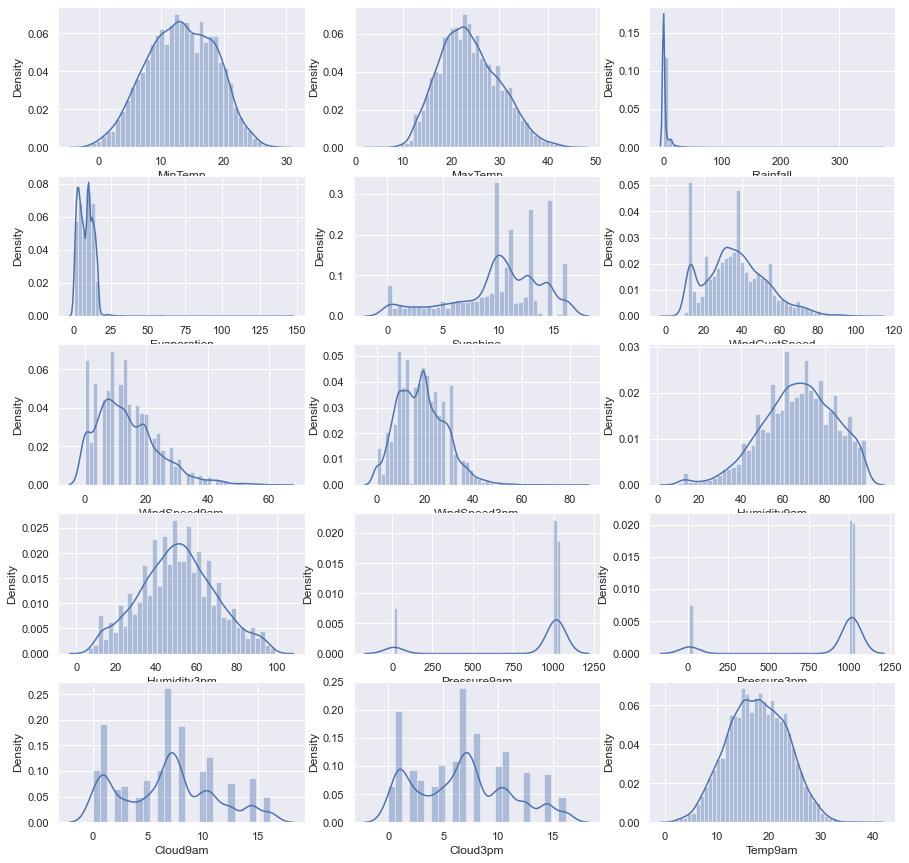

In [68]:
def plotHist():
    fig, ax =plt.subplots(5,3, figsize=(15,15))
    i=0;j=0;k=0
    while i<=4:
        while j<=2:
            sns.distplot(df[numerical[k]], ax=ax[i, j])
            j+=1;k+=1
        j=0;i+=1; 
    plt.savefig('distribution_before_removing_missing_values_from_numerical_columns.png')
    plt.show()
plotHist()

# Checking outliers in Numerical columns

Index(['MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine',
       'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am',
       'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm',
       'Temp9am', 'Temp3pm'],
      dtype='object')


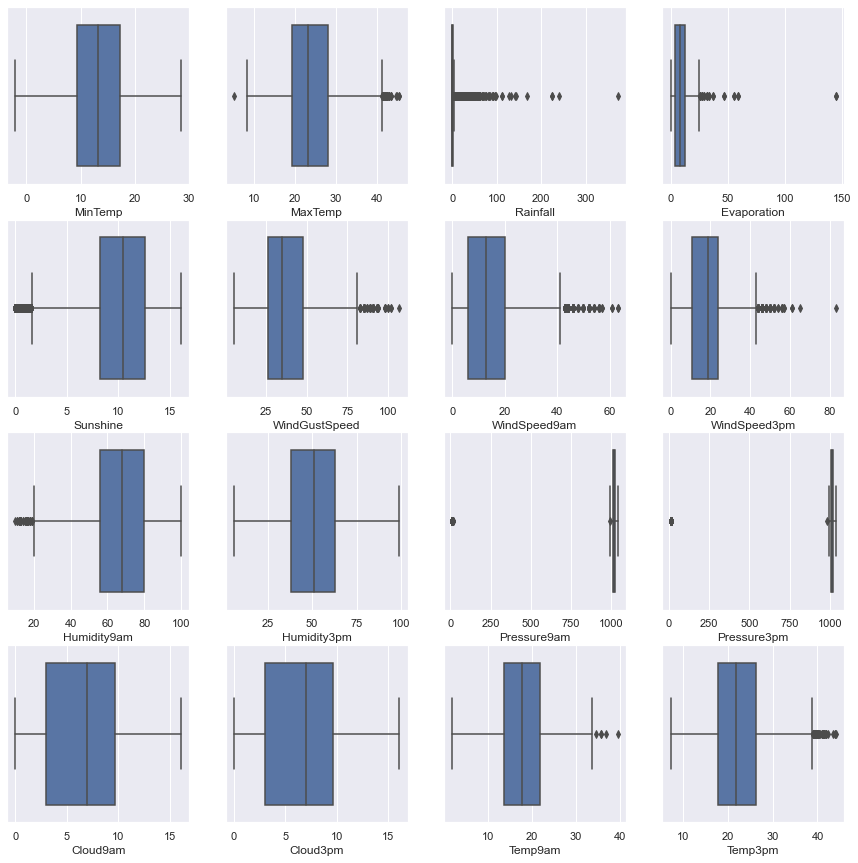

In [69]:
num_of_rows = 4
num_of_cols = 4
fig, ax = plt.subplots(num_of_rows, num_of_cols, figsize=(15,15))
print(numerical)
i=0;j=0;k=0;
while i<num_of_rows:
    while j<num_of_cols:
        sns.boxplot(df[numerical[k]], ax=ax[i, j])
        k+=1;j+=1
    j=0;i+=1
plt.savefig('before_removing_outliers_from_numerical_columns.png')
plt.show()

# Removing Outliers

In [70]:
lsUpper = []
lsLower = []
def removeOutliers(numerical):
    for i in range(len(numerical)):
        q1 = df[numerical[i]].quantile(0.25)
        q3 = df[numerical[i]].quantile(0.75)
        IQR = q3-q1
        minimum = q1 - 1.5 * IQR
        maximum = q3 + 1.5 * IQR
        df.loc[(df[numerical[i]] <= minimum), numerical[i]] = minimum
        df.loc[(df[numerical[i]] >= maximum), numerical[i]] = maximum  
removeOutliers(numerical)

Index(['MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine',
       'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am',
       'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm',
       'Temp9am', 'Temp3pm'],
      dtype='object')


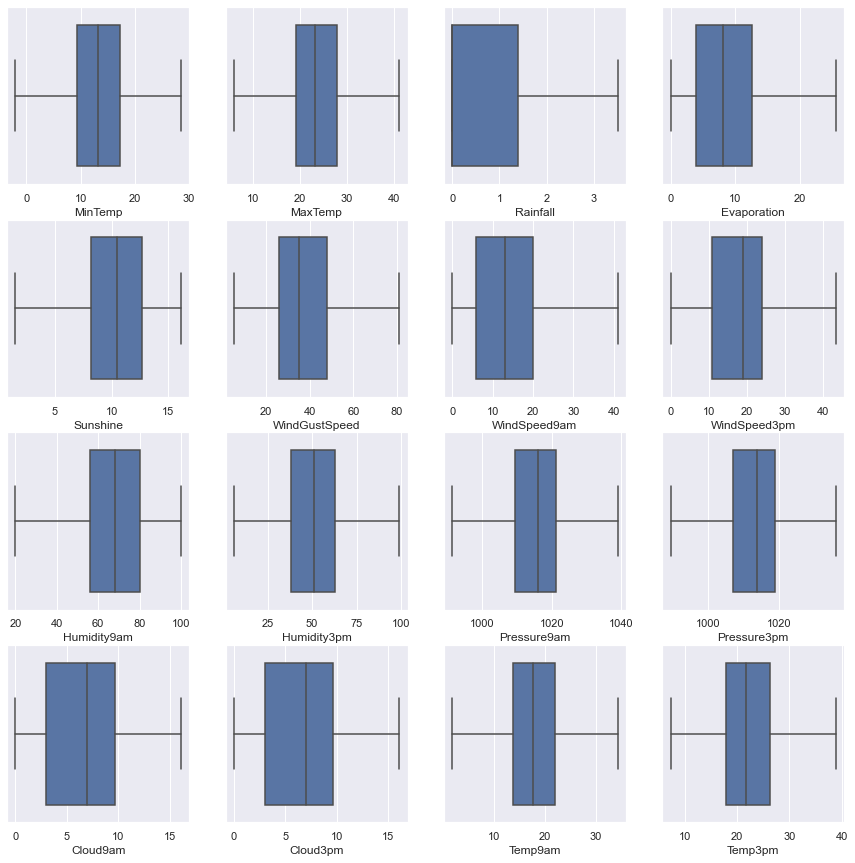

In [71]:
num_of_rows = 4
num_of_cols = 4
fig, ax = plt.subplots(num_of_rows, num_of_cols, figsize=(15,15))
print(numerical)
i=0;j=0;k=0;
while i<num_of_rows:
    while j<num_of_cols:
        sns.boxplot(df[numerical[k]], ax=ax[i, j])
        k+=1;j+=1
    j=0;i+=1
plt.savefig('after_removing_outliers_from_numerical_columns.png')
plt.show()

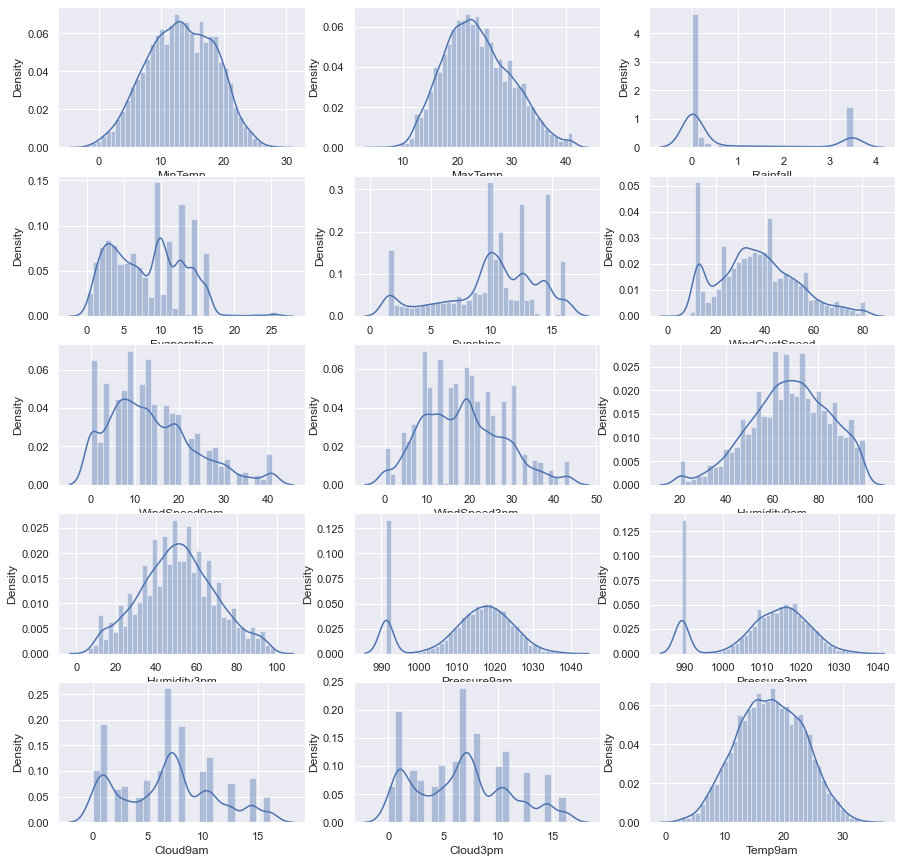

In [72]:
def plotHist():
    fig, ax =plt.subplots(5,3, figsize=(15,15))
    i=0;j=0;k=0
    while i<=4:
        while j<=2:
            sns.distplot(df[numerical[k]], ax=ax[i, j])
            j+=1;k+=1
        j=0;i+=1;
    plt.savefig('distribution_after_removing_outliers_from_numerical_columns.png')
    plt.show()
plotHist()

# Removing Missing Values from categorical data

In [73]:
# For WindGustDir column only
ls_WGD = []
loc_for_miss = df["Location"].unique()
for j in range(len(loc_for_miss)):
    df_allNanWGD = df.loc[df["Location"] == loc_for_miss[j]]
    if(df_allNanWGD["WindGustDir"].isnull().all()):
        ls_WGD.append(loc_for_miss[j])

Check if all values of columns wrt every location are nan . If so replace them by geographically searching location near to given cities. For special case of WindGustDir where some cities have mode as nan. So handling these cities saperately

In [74]:
#first handling these cities only
# 'Newcastle' is near to "Sydnay" with mode W,
# 'Albany' is near to "Perth" with mode SW

# Imputing W in Newcastle for WindGustDir column
df.loc[df["Location"] == "Newcastle", "WindGustDir"] = "W"
df.loc[df["Location"] == "Albany", "WindGustDir"] = "SW"

['RainToday', 'WindDir9am', 'WindGustDir', 'WindDir3pm']


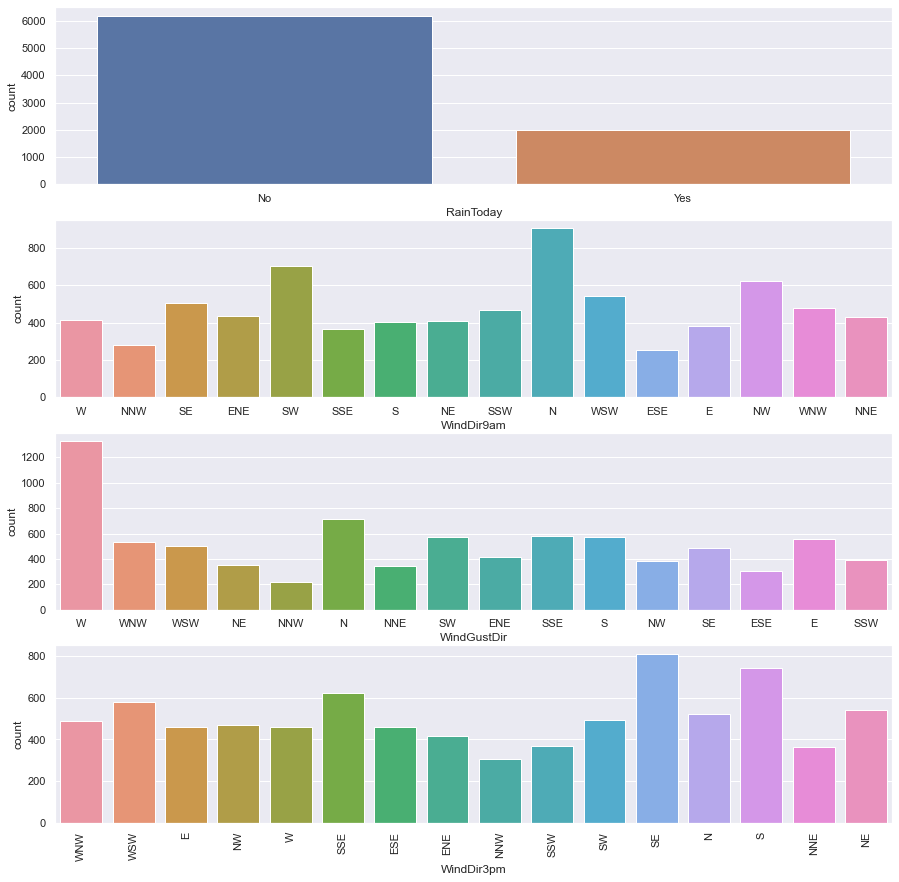

In [75]:
categoricalPlot = ['RainToday', 'WindDir9am','WindGustDir', 'WindDir3pm']
fig, ax = plt.subplots(4, 1, figsize=(15,15))
print(categoricalPlot)
c=0
while c<=3:
    sns.countplot(df[categoricalPlot[c]], ax=ax[c])
    plt.xticks(rotation=90)
    c+=1
plt.savefig('distribution_after_removing_missing_values_from_categorical_columns.png')
plt.show()

# Feature Engineering

In [76]:
#Adding extra columns by splitting date column
df['Year']=[d.split('-')[0] for d in df.Date]
df['Year'].astype(float)
df['Month']=[d.split('-')[1] for d in df.Date]
df['Day']=[d.split('-')[2] for d in df.Date]
df.drop(columns=["Date"], axis=1, inplace=True)

In [77]:
#performing labelEncoding on y i.e RainTommorrow
le = LabelEncoder()
df['RainTomorrow']= le.fit_transform(df['RainTomorrow'])
df.RainTomorrow.value_counts()

0    6195
1    1991
2     239
Name: RainTomorrow, dtype: int64

In [78]:
#Performing one hot encoding on RainToday, WindGustDir, WindDir9am, WindDir3pm, Location.
df_WindGustDir = pd.get_dummies(df["WindGustDir"], prefix="1")
df_WindDir9am = pd.get_dummies(df["WindDir9am"], prefix="2")
df_WindDir3pm = pd.get_dummies(df["WindDir3pm"], prefix="3")
df_RainToday = pd.get_dummies(df["RainToday"])
location_ohe = pd.get_dummies(df["Location"])
df_new = pd.concat([df, df_WindGustDir, df_WindDir9am, df_WindDir3pm, df_RainToday, location_ohe], axis=1)
df_new.drop(columns=["WindGustDir", "WindDir9am", "WindDir3pm", "RainToday", "Location"], axis=1, inplace=True)

In [79]:
#Taking average of columns annd create new column
df_new["AveTemp"] = (df_new["MinTemp"]+df_new["MaxTemp"])/2
df_new["WindSpeed12pm"] = (df_new["WindSpeed3pm"]+df_new["WindSpeed9am"])/2
df_new["Humidity12pm"] = (df_new["Humidity3pm"]+df_new["Humidity9am"])/2
df_new["Pressure12pm"] = (df_new["Pressure3pm"]+df_new["Pressure9am"])/2
df_new["Cloud12pm"] = (df_new["Cloud3pm"]+df_new["Cloud9am"])/2
df_new["Temp12am"] = (df_new["Temp3pm"]+df_new["Temp9am"])/2

# Splitting Test and Train data

In [80]:
X = df_new.loc[:,df_new.columns != "RainTomorrow"]
y = df_new.loc[:,["RainTomorrow"]]

In [81]:
y.RainTomorrow.value_counts()

0    6195
1    1991
2     239
Name: RainTomorrow, dtype: int64

In [82]:
Xtrain, Xtest, ytrain, ytest = train_test_split(X, y, train_size=0.80, random_state=2, )
print(Xtrain.shape)
print(Xtest.shape)
print(ytrain.shape)
print(ytest.shape)

(6740, 87)
(1685, 87)
(6740, 1)
(1685, 1)


In [83]:
print(Xtrain.shape)
print(ytrain.shape)

(6740, 87)
(6740, 1)


In [84]:
scaler = StandardScaler()
#fitting standardization on train data only
scaler.fit(Xtrain)
XtrainSTD = scaler.transform(Xtrain)
XtestSTD = scaler.transform(Xtest)

In [85]:
XtrainSTD.shape

(6740, 87)

# Performing PCA

In [86]:
pca = PCA(n_components=50)
pca.fit(XtrainSTD)
XtrainPCA = pca.transform(XtrainSTD)
XtestPCA = pca.transform(XtestSTD)
XtrainPCA.shape

(6740, 50)

In [87]:
pca.explained_variance_ratio_

array([0.08233092, 0.0657731 , 0.04560377, 0.0409909 , 0.03805891,
       0.02934926, 0.02433419, 0.02368028, 0.02223193, 0.02039397,
       0.01938806, 0.01770909, 0.01704734, 0.01651024, 0.01571614,
       0.01479985, 0.01421483, 0.01407211, 0.01382537, 0.01360671,
       0.01347395, 0.01338764, 0.01316433, 0.0129384 , 0.01277654,
       0.01276249, 0.0125567 , 0.01231196, 0.01222139, 0.01211233,
       0.01197397, 0.01191983, 0.01169986, 0.01156955, 0.01148541,
       0.01128877, 0.01123647, 0.01116007, 0.01100326, 0.01090568,
       0.0107816 , 0.01051696, 0.01042128, 0.01019619, 0.01004043,
       0.0100211 , 0.00975425, 0.0095681 , 0.00948005, 0.00906582])

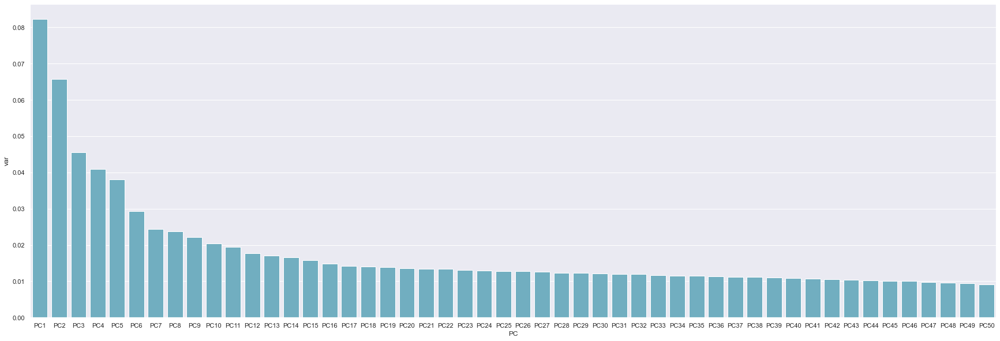

In [88]:
PC = ['PC1','PC2','PC3','PC4','PC5','PC6','PC7','PC8','PC9','PC10',
     'PC11','PC12','PC13','PC14','PC15','PC16','PC17','PC18','PC19','PC20',
     'PC21','PC22','PC23','PC24','PC25','PC26','PC27','PC28','PC29','PC30',
     'PC31','PC32','PC33','PC34','PC35','PC36','PC37','PC38','PC39','PC40',
     'PC41','PC42','PC43','PC44','PC45','PC46','PC47','PC48','PC49','PC50']
pca_df = pd.DataFrame({'var':pca.explained_variance_ratio_, 'PC':PC})
plt.figure(figsize=(30,10))
sns.barplot(x='PC',y="var", data=pca_df, color="c");

# Modeling

In [89]:
rf = RandomForestClassifier(random_state=0)
parameters = {'bootstrap': [True, False],
              'min_samples_split':[2, 3, 4],
              'criterion':['entropy', 'gini'],
              'n_estimators':[100, 200]
             }
grid_search1 = GridSearchCV(estimator=rf, param_grid=parameters, refit='roc_auc', scoring=['accuracy', 'roc_auc'], cv=10, n_jobs=-1)
grid_search1 = grid_search1.fit(XtrainSTD, ytrain.values.ravel())

In [90]:
print("Best Parameters : ",grid_search1.best_params_)
print("Best AUC-ROC : ", grid_search1.best_score_)

Best Parameters :  {'bootstrap': True, 'criterion': 'entropy', 'min_samples_split': 2, 'n_estimators': 100}
Best AUC-ROC :  nan


In [91]:
rf = RandomForestClassifier(bootstrap= False, criterion= 'entropy', min_samples_split= 4, n_estimators= 200, random_state=0)
rf.fit(XtrainSTD, ytrain.values.ravel())
ypred = rf.predict(XtestSTD)
accuracy = accuracy_score(ypred, ytest)
print(accuracy)

0.8896142433234422


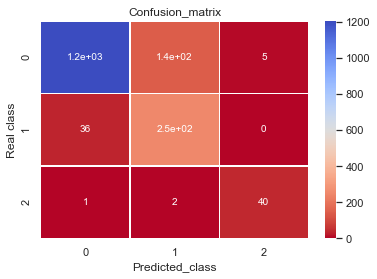

In [92]:
cnf_matrix = confusion_matrix(ypred, ytest)
sns.heatmap(cnf_matrix,cmap="coolwarm_r",annot=True,linewidths=0.5)
plt.title("Confusion_matrix")
plt.xlabel("Predicted_class")
plt.ylabel("Real class")
plt.show()

In [93]:
grid_search1 = grid_search1.fit(XtrainSTD, ytrain.values.ravel())
print("Best Parameters : ",grid_search1.best_params_)
print("Best AUC-ROC : ", grid_search1.best_score_)

Best Parameters :  {'bootstrap': True, 'criterion': 'entropy', 'min_samples_split': 2, 'n_estimators': 100}
Best AUC-ROC :  nan


# Correlation-Positive Linear Relationship

(0.0, 2.1)

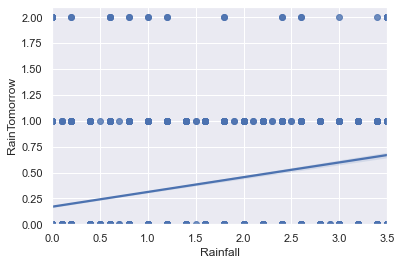

In [98]:
sns.regplot(x="Rainfall",y="RainTomorrow",data=df)
plt.ylim(0,)

(0.0, 30.025)

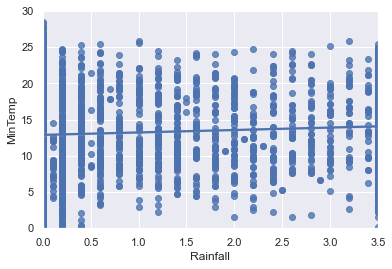

In [99]:
sns.regplot(x="Rainfall",y="MinTemp",data=df)
plt.ylim(0,)

# Correlation-Negative Linear Relationship

(0.0, 42.96)

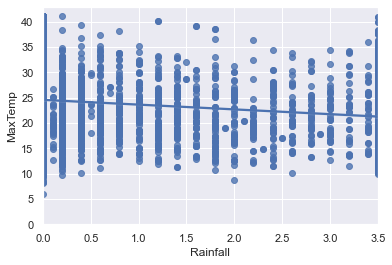

In [101]:
sns.regplot(x="Rainfall",y="MaxTemp",data=df)
plt.ylim(0,)